<a href="https://colab.research.google.com/github/hibaelhamydy/Examen-android/blob/master/version_0_good.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Notebook 1: Generation des objets dentaires (nuage de points)


1.   convertir les vertices en nuages de points
2.   3000 vertices per object
3.   save as .ply







>Telecharger librairies (open3d,pytorch_3d,...)


In [ ]:
!pip install "git+https://github.com/facebookresearch/pytorch3d.git"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/pytorch3d.git to /tmp/pip-req-build-azknbo3_
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/pytorch3d.git /tmp/pip-req-build-azknbo3_
  Resolved https://github.com/facebookresearch/pytorch3d.git to commit cd5db076d5c849494b86e9404f2a30ff5aa7f0e8
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 435.6 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch3d: filename=pytorch3d-0.7.4-cp310-cp310-linux_x86_64.whl size=58476481 sha256=49ce3849c32fe0f2e5045fa95c4e565b633685424be05959742bd7d37b78e91e
  Stored in directory: /tmp/pip-ephem-wheel-cache-u8huzh7t/wheels/dd/74/cc/b9266c863f19026f796e59a04e1cd9eb375

In [ ]:
!pip install matplotlib==3.2.2
!pip install plotly
!pip install open3d

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 MB 18.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for matplotlib: filename=matplotlib-3.2.2-cp310-cp310-linux_x86_64.whl size=12292124 sha256=8a4686c95b8662740a8ccb5ee957a35964e195dda4f3ac983e8a6feacdad503e
  Stored in directory: /root/.cache/pip/wheels/bb/81/f3/48b8bd245846ae69fcb2281c84e848bfea1f5260a870c148ae
Successfully built matplotlib
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
mizani 0.8.1 requires matplotlib>=3.5.0, but you have matplotlib 3.2.2 which is incompatible.
plotnine 0.10.1 requires matplot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 420.5/420.5 MB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 94.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.1/77.1 kB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.3/138.3 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 89.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 24.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 75.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 99.1 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.4
    Uninstalling widgetsnbextension-3.6.4:
      Successful



> Fonctions






> Lecture de données



In [ ]:
class ReadDataset(Dataset):
    def __init__(self,  source):

        self.data = torch.from_numpy(source).float()


    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        return self.data[index]



> Visualisation de données



In [ ]:
def plotPCbatch(pcArray1, pcArray2, show = True, save = False, name=None, fig_count=9 , sizex = 18, sizey=6):

    pc1 = pcArray1[0:fig_count]
    pc2 = pcArray2[0:fig_count]

    fig=plt.figure(figsize=(sizex, sizey))

    for i in range(fig_count*2):

        ax = fig.add_subplot(2,fig_count,i+1, projection='3d')

        if(i<fig_count):
            ax.scatter(pc1[i,:,0], pc1[i,:,1], pc1[i,:,2], c='b', marker='.', alpha=0.8, s=8)
        else:
            ax.scatter(pc2[i-fig_count,:,0], pc2[i-fig_count,:,1], pc2[i-fig_count,:,2], c='b', marker='.', alpha=0.8, s=8)

        ax.set_xlim3d(0, 1)
        ax.set_ylim3d(0, 1)
        ax.set_zlim3d(0, 1)
        #ax.view_init(50, 20)

    plt.subplots_adjust(wspace=0, hspace=0)
    if(save):
        fig.savefig(name + '.png')
        plt.close(fig)

    if(show):
        plt.show()
    else:
        return fig

In [ ]:
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import
import numpy as np
import matplotlib.pyplot as plt
def visualize_mesh(pos, face):
    # from the tutorial https://colab.research.google.com/drive/1D45E5bUK3gQ40YpZo65ozs7hg5l-eo_U?usp=sharing#scrollTo=SvsEAR28LUI7
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.axes.xaxis.set_ticklabels([])
    ax.axes.yaxis.set_ticklabels([])
    ax.axes.zaxis.set_ticklabels([])
    ax.plot_trisurf(pos[:, 0], pos[:, 1], pos[:, 2], triangles=face.t(), antialiased=False)
    plt.show()


def visualize_points(points, ax=None, show_grid=False, is_shapenet=False):
    fig = plt.figure()
    if ax is None:
        ax = fig.add_subplot(projection='3d')
    ax.patch.set_alpha(0)
    ax.view_init(elev=10., azim=240.)
    ax.grid(show_grid)
    if is_shapenet:
      ax.scatter(points[:,0], points[:,2], points[:,1], c=points[:,2], cmap='plasma', s=10)
    else:
      ax.scatter(points[:,0], points[:,1], points[:,2], c=points[:,1], cmap='plasma', s=10)


def visualize_real_and_generated_samples(samples, show_grid=False, is_shapenet=False):
    fig = plt.figure(figsize=(16, 8))
    for i, sample in enumerate(samples):
        ax = fig.add_subplot(1, 2, i+1, projection='3d')
        visualize_points(sample, ax, show_grid, is_shapenet)

def visualize_points_3d(points, show_grid=False, is_shapenet=False):
    fig = go.Figure()

    if is_shapenet:
        fig.add_trace(go.Scatter3d(
            x=points[:, 0],
            y=points[:, 2],
            z=points[:, 1],
            mode='markers',
            marker=dict(
                size=10,
                color=points[:, 2],
                colorscale='plasma',
                opacity=1.0
            )
        ))
    else:
        fig.add_trace(go.Scatter3d(
            x=points[:, 0],
            y=points[:, 1],
            z=points[:, 2],
            mode='markers',
            marker=dict(
                size=10,
                color=points[:, 1],
                colorscale='plasma',
                opacity=1.0
            )
        ))

    fig.update_layout(scene=dict(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        zaxis=dict(visible=False),
        aspectmode='cube'
    ))

    fig.update_layout(showlegend=False)

    fig.show()




> Fonctions DataLoader SplitData



In [ ]:
def GetDataLoaders(npArray, batch_size, train_set_percentage = 0.9, shuffle=True, num_workers=0, pin_memory=True):


    pc = ReadDataset(npArray)

    train_set, test_set = RandomSplit(pc, train_set_percentage)

    train_loader = DataLoader(train_set, shuffle=shuffle, num_workers=num_workers, batch_size=batch_size, pin_memory=pin_memory)
    test_loader = DataLoader(test_set, shuffle=shuffle, num_workers=num_workers, batch_size=batch_size, pin_memory=pin_memory)

    return train_loader, test_loader

In [ ]:
def RandomSplit(datasets, train_set_percentage):
    lengths = [int(len(datasets)*train_set_percentage), len(datasets)-int(len(datasets)*train_set_percentage)]
    return random_split(datasets, lengths)



> Visualiser un echentillon



In [ ]:
import plotly.graph_objects as go
fig = plt.figure(figsize=(7,7))
a=pc1[35]

visualize_points_3d(a)

<Figure size 700x700 with 0 Axes>



> importation des librairies



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import numpy as np
from torch.autograd import Variable

from torchsummary import summary

#from torch_geometric.datasets import ModelNet, ShapeNet
#from torch_geometric.transforms import Compose, FixedPoints, SamplePoints, NormalizeScale

from google.colab import drive
import os

import open3d as o3d

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import time

%matplotlib inline


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
torch.__version__, device

('2.0.1+cu118', device(type='cuda'))



> Connexion a drive



In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

# Set the path to the dental_dataset folder
folder_path = '/content/drive/MyDrive/vertices'

Mounted at /content/drive


In [ ]:
#lecture des fichiers .ply et leur enregistrement sous format d'un tableau numpy et les telecharger sous format .npy
point_cloud_list = []
# Set the path to the dental_dataset folder
folder_path = '/content/drive/MyDrive/vertices'
# Get a list of file names in the folder_path directory
file_list = os.listdir(folder_path)

 #Loop over the .ply files
for file_name in file_list:
    # Construct the full path to each .ply file
    file_path = os.path.join(folder_path, file_name)

    #Read .ply file
    pcd = o3d.io.read_point_cloud(file_path)

    #Convert open3d format to numpy array
    point_cloud_in_numpy = np.asarray(pcd.points)

    #Append the numpy array to the point_cloud_list
    point_cloud_list.append(point_cloud_in_numpy)

In [ ]:
# Save the point_cloud_list as .npy file
save_path = '/content/drive/MyDrive/3000_data.npy'
np.save(save_path, np.array(point_cloud_list))

In [ ]:
pc1= np.load('/content/drive/MyDrive/3000_data.npy')

In [ ]:
pc1.shape

(51, 3000, 3)



> Augmentation des données (rotation et scaling)



In [ ]:
def rotate_point_cloud(batch_data):
    """ Randomly rotate the point clouds to augment the dataset.
        Rotation is performed per shape along the up direction.
        Input:
          BxNx3 array, original batch of point clouds
        Return:
          BxNx3 array, rotated batch of point clouds
    """
    rotated_data = np.zeros(batch_data.shape, dtype=np.float32)
    for k in range(batch_data.shape[0]):
        rotation_angle = np.random.uniform() * 2 * np.pi
        cosval = np.cos(rotation_angle)
        sinval = np.sin(rotation_angle)
        rotation_matrix = np.array([[cosval, 0, sinval],
                                    [0, 1, 0],
                                    [-sinval, 0, cosval]])
        shape_pc = batch_data[k, ...]
        rotated_data[k, ...] = np.dot(shape_pc.reshape((-1, 3)), rotation_matrix)
    return rotated_data

In [ ]:
degrees=[]
for i in range(36):
    degrees.append(i*10)

In [ ]:
def Normalize(Points):
    assert len(Points.shape)==2

    norm_pointcloud = Points - np.mean(Points, axis=0)
    norm_pointcloud /= np.max(np.linalg.norm(norm_pointcloud, axis=1))

    return  norm_pointcloud

In [ ]:
#rotation

def rotation_Z(v,degrees):

    arrayOfRotatedObjectsz=[]
    verts=v
    for i in degrees:
        theta = np.radians(i)
        A = np.array(((np.cos(theta), -np.sin(theta), 0),
                      (np.sin(theta), np.cos(theta), 0),
                      (0, 0, 1)), dtype=verts.dtype)

        Object_rotatedz=A.dot(verts.T).T
        arrayOfRotatedObjectsz.append(Object_rotatedz)


    return arrayOfRotatedObjectsz

# rotate x
def rotation_x(v,degrees):
    arrayOfRotatedObjectsx=[]
    verts=v
    for i in degrees:
        theta = np.radians(i)
        A = np.array(((1, 0, 0),
                  (0, np.cos(theta), -np.sin(theta)),
                  (0, np.sin(theta), np.cos(theta))),dtype=verts.dtype)

        Object_rotatedx=A.dot(verts.T).T
        arrayOfRotatedObjectsx.append(Object_rotatedx)


    return arrayOfRotatedObjectsx

# rotate y
def rotation_y(v,degrees):
    arrayOfRotatedObjectsy=[]
    verts=v
    for i in degrees:
        theta = np.radians(i)
        A = np.array(((np.cos(theta), 0, -np.sin(theta)),
                  (0, 1, 0),
                  (np.sin(theta), 0, np.cos(theta))),dtype=verts.dtype)

        Object_rotatedy=A.dot(verts.T).T
        arrayOfRotatedObjectsy.append(Object_rotatedy)


    return arrayOfRotatedObjectsy



> Visualiser un echentillon



<Figure size 700x700 with 0 Axes>

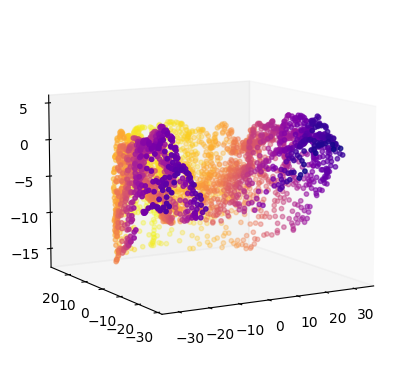

In [ ]:
fig = plt.figure(figsize=(7,7))
a=pc1[3]

visualize_points(a)



> Augmentation de données



In [ ]:
#normalisation
normalized_dataset = []
for pc in pc1:
    normalized_item = Normalize(pc)
    normalized_dataset.append(normalized_item)
normalized_data = np.array(normalized_dataset)
normalized_data.shape

(51, 3000, 3)

In [ ]:
# Rotate all objects first
rotated_dataset = []

for point_cloud in normalized_data:
    rotated_clouds_x = rotation_x(point_cloud, degrees)
    rotated_clouds_y = rotation_y(point_cloud, degrees)
    rotated_clouds_z = rotation_Z(point_cloud, degrees)

    rotated_dataset.append(rotated_clouds_x)
    rotated_dataset.append(rotated_clouds_y)
    rotated_dataset.append(rotated_clouds_z)

rotated_data = np.concatenate(rotated_dataset, axis=0)
rotated_data.shape

(5508, 3000, 3)

In [ ]:
# Save the scaled dataset
np.save('/content/drive/MyDrive/full_rotated_vertices.npy', rotated_data)



> Lecture données apres augmentation



In [ ]:
pc = ReadDataset(rotated_data)
new_data = rotated_data
print(new_data.shape)

# load dataset from numpy array and divide 90%-10% randomly for train and test sets
train_loader, test_loader = GetDataLoaders(npArray=new_data, batch_size=32)

# Assuming all models have the same size, get the point size from the first model
point_size = len(train_loader.dataset[1])
print(point_size)

(5508, 3000, 3)
3000


In [ ]:
import plotly.graph_objects as go
visualize_points_3d(new_data[4001])



> Metriques d'evaluation



**Coverage and fidelity**

In [ ]:
def coverage(real_clouds, gen_clouds, distance_fn):
    matches = [ torch.argmin(torch.as_tensor([distance_fn(a, b) for b in real_clouds])) for a in gen_clouds ]
    score = len(torch.unique(matches)) / len(gen_clouds)
    return score


def fidelity(real_clouds, gen_clouds, distance_fn):
    distances = [ [distance_fn(a, b) for b in gen_clouds] for a in real_clouds ]
    distances = torch.as_tensor(distances)

    min_distances = distances.min(dim=-1)

    score = torch.mean(min_distances)

    return score

**the chamfer loss module code**

In [ ]:

from typing import Union

import torch
import torch.nn.functional as F
from pytorch3d.ops.knn import knn_gather, knn_points
from pytorch3d.structures.pointclouds import Pointclouds


def _validate_chamfer_reduction_inputs(
    batch_reduction: Union[str, None], point_reduction: str
) -> None:

    if batch_reduction is not None and batch_reduction not in ["mean", "sum"]:
        raise ValueError('batch_reduction must be one of ["mean", "sum"] or None')
    if point_reduction not in ["mean", "sum"]:
        raise ValueError('point_reduction must be one of ["mean", "sum"]')


def _handle_pointcloud_input(
    points: Union[torch.Tensor, Pointclouds],
    lengths: Union[torch.Tensor, None],
    normals: Union[torch.Tensor, None],
):
    if isinstance(points, Pointclouds):
        X = points.points_padded()
        lengths = points.num_points_per_cloud()
        normals = points.normals_padded()  # either a tensor or None
    elif torch.is_tensor(points):
        if points.ndim != 3:
            raise ValueError("Expected points to be of shape (N, P, D)")
        X = points
        if lengths is not None:
            if lengths.ndim != 1 or lengths.shape[0] != X.shape[0]:
                raise ValueError("Expected lengths to be of shape (N,)")
            if lengths.max() > X.shape[1]:
                raise ValueError("A length value was too long")
        if lengths is None:
            lengths = torch.full(
                (X.shape[0],), X.shape[1], dtype=torch.int64, device=points.device
            )
        if normals is not None and normals.ndim != 3:
            raise ValueError("Expected normals to be of shape (N, P, 3")
    else:
        raise ValueError(
            "The input pointclouds should be either "
            + "Pointclouds objects or torch.Tensor of shape "
            + "(minibatch, num_points, 3)."
        )
    return X, lengths, normals


def chamfer_distance(
    x,
    y,
    x_lengths=None,
    y_lengths=None,
    x_normals=None,
    y_normals=None,
    weights=None,
    batch_reduction: Union[str, None] = "mean",
    point_reduction: str = "mean",
    norm: int = 2,
):

    _validate_chamfer_reduction_inputs(batch_reduction, point_reduction)

    if not ((norm == 1) or (norm == 2)):
        raise ValueError("Support for 1 or 2 norm.")

    x, x_lengths, x_normals = _handle_pointcloud_input(x, x_lengths, x_normals)
    y, y_lengths, y_normals = _handle_pointcloud_input(y, y_lengths, y_normals)

    return_normals = x_normals is not None and y_normals is not None

    N, P1, D = x.shape
    P2 = y.shape[1]

    # Check if inputs are heterogeneous and create a lengths mask.
    is_x_heterogeneous = (x_lengths != P1).any()
    is_y_heterogeneous = (y_lengths != P2).any()
    x_mask = (
        torch.arange(P1, device=x.device)[None] >= x_lengths[:, None]
    )  # shape [N, P1]
    y_mask = (
        torch.arange(P2, device=y.device)[None] >= y_lengths[:, None]
    )  # shape [N, P2]

    if y.shape[0] != N or y.shape[2] != D:
        raise ValueError("y does not have the correct shape.")
    if weights is not None:
        if weights.size(0) != N:
            raise ValueError("weights must be of shape (N,).")
        if not (weights >= 0).all():
            raise ValueError("weights cannot be negative.")
        if weights.sum() == 0.0:
            weights = weights.view(N, 1)
            if batch_reduction in ["mean", "sum"]:
                return (
                    (x.sum((1, 2)) * weights).sum() * 0.0,
                    (x.sum((1, 2)) * weights).sum() * 0.0,
                )
            return ((x.sum((1, 2)) * weights) * 0.0, (x.sum((1, 2)) * weights) * 0.0)

    cham_norm_x = x.new_zeros(())
    cham_norm_y = x.new_zeros(())

    x_nn = knn_points(x, y, lengths1=x_lengths, lengths2=y_lengths, norm=norm, K=1)
    y_nn = knn_points(y, x, lengths1=y_lengths, lengths2=x_lengths, norm=norm, K=1)

    cham_x = x_nn.dists[..., 0]  # (N, P1)
    cham_y = y_nn.dists[..., 0]  # (N, P2)

    if is_x_heterogeneous:
        cham_x[x_mask] = 0.0
    if is_y_heterogeneous:
        cham_y[y_mask] = 0.0

    if weights is not None:
        cham_x *= weights.view(N, 1)
        cham_y *= weights.view(N, 1)

    if return_normals:
        # Gather the normals using the indices and keep only value for k=0
        x_normals_near = knn_gather(y_normals, x_nn.idx, y_lengths)[..., 0, :]
        y_normals_near = knn_gather(x_normals, y_nn.idx, x_lengths)[..., 0, :]

        cham_norm_x = 1 - torch.abs(
            F.cosine_similarity(x_normals, x_normals_near, dim=2, eps=1e-6)
        )
        cham_norm_y = 1 - torch.abs(
            F.cosine_similarity(y_normals, y_normals_near, dim=2, eps=1e-6)
        )

        if is_x_heterogeneous:
            cham_norm_x[x_mask] = 0.0
        if is_y_heterogeneous:
            cham_norm_y[y_mask] = 0.0

        if weights is not None:
            cham_norm_x *= weights.view(N, 1)
            cham_norm_y *= weights.view(N, 1)

    # Apply point reduction
    cham_x = cham_x.sum(1)  # (N,)
    cham_y = cham_y.sum(1)  # (N,)
    if return_normals:
        cham_norm_x = cham_norm_x.sum(1)  # (N,)
        cham_norm_y = cham_norm_y.sum(1)  # (N,)
    if point_reduction == "mean":
        x_lengths_clamped = x_lengths.clamp(min=1)
        y_lengths_clamped = y_lengths.clamp(min=1)
        cham_x /= x_lengths_clamped
        cham_y /= y_lengths_clamped
        if return_normals:
            cham_norm_x /= x_lengths_clamped
            cham_norm_y /= y_lengths_clamped

    if batch_reduction is not None:
        # batch_reduction == "sum"
        cham_x = cham_x.sum()
        cham_y = cham_y.sum()
        if return_normals:
            cham_norm_x = cham_norm_x.sum()
            cham_norm_y = cham_norm_y.sum()
        if batch_reduction == "mean":
            div = weights.sum() if weights is not None else max(N, 1)
            cham_x /= div
            cham_y /= div
            if return_normals:
                cham_norm_x /= div
                cham_norm_y /= div

    cham_dist = cham_x + cham_y
    cham_normals = cham_norm_x + cham_norm_y if return_normals else None

    return cham_dist, cham_normals

**Implementation**

In [ ]:
class ChamferLoss(nn.Module):
    def __init__(self, point_reduction='sum'):
        super(ChamferLoss, self).__init__()
        self.point_reduction = point_reduction

    def forward(self, x, y):
        # https://pytorch3d.readthedocs.io/en/latest/_modules/pytorch3d/loss/chamfer.html
        chamfer_dist, chamfer_normals = chamfer_distance(x, y, point_reduction=self.point_reduction)
        return chamfer_dist



> Architecture d'autoencodeur



In [ ]:
class Autoencoder(nn.Module):
  def __init__(self, encoder_in_ch=3, encoder_out_ch=128, n_points=3000):
        super(Autoencoder, self).__init__()
        self.n_points = n_points

        self.encoder = nn.Sequential(
            nn.Conv1d(encoder_in_ch, 64, 1, 1), nn.BatchNorm1d(64), nn.ReLU(True),
            nn.Conv1d(64, 128, 1, 1), nn.BatchNorm1d(128), nn.ReLU(True),
            nn.Conv1d(128, 128, 1, 1), nn.BatchNorm1d(128), nn.ReLU(True),
            nn.Conv1d(128, 256, 1, 1), nn.BatchNorm1d(256), nn.ReLU(True),
            nn.Conv1d(256, encoder_out_ch, 1, 1), nn.BatchNorm1d(encoder_out_ch), nn.ReLU(True),
        )

        # outputs (batch_size x encoder_out_ch x n_points)
        # we then maxpool the output in the forward method,
        # so the input to the decoder becomes (batch_size x encoder_out_ch)

        self.decoder = nn.Sequential(
            nn.Linear(encoder_out_ch, 256), nn.ReLU(True),
            nn.Linear(256, 256), nn.ReLU(True),
            nn.Linear(256, 3*n_points)
        )

  def forward(self, x):
      x = self.encoder(x)
      x, _ = torch.max(x, dim=-1)
      x = self.decoder(x)
      return x.view(x.size(0), 3, -1)

In [ ]:
ae_model = Autoencoder(encoder_in_ch=3, encoder_out_ch=128, n_points=3000).to(device)
summary(ae_model, (3, 3000))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv1d-1             [-1, 64, 3000]             256
       BatchNorm1d-2             [-1, 64, 3000]             128
              ReLU-3             [-1, 64, 3000]               0
            Conv1d-4            [-1, 128, 3000]           8,320
       BatchNorm1d-5            [-1, 128, 3000]             256
              ReLU-6            [-1, 128, 3000]               0
            Conv1d-7            [-1, 128, 3000]          16,512
       BatchNorm1d-8            [-1, 128, 3000]             256
              ReLU-9            [-1, 128, 3000]               0
           Conv1d-10            [-1, 256, 3000]          33,024
      BatchNorm1d-11            [-1, 256, 3000]             512
             ReLU-12            [-1, 256, 3000]               0
           Conv1d-13            [-1, 128, 3000]          32,896
      BatchNorm1d-14            [-1, 12



> Optimisation des parametres



In [ ]:
# hyperparameters:
lr = 5*1e-4

# the Adam optimizer:
optimizer = optim.Adam(params=ae_model.parameters(), lr=lr)

# the Chamfer loss:
criterion = ChamferLoss()



> Parametres d'entrainement



In [ ]:
batch_size = 32
dataloader = DataLoader(dataset=pc,
                        batch_size=batch_size,
                        shuffle=True,
                        drop_last=True)

print('Batch size: ', batch_size)
print('Number of batches:', len(dataloader))

Batch size:  32
Number of batches: 172




> Entrainement de l'AE



In [ ]:
import time
import torch
import torch.nn as nn

epochs = 500
print_period = 20
n_points = 3000
losses = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae_model.to(device)

best_loss = float('inf')
patience = 5  # Number of epochs to wait for improvement
no_improvement = 0

for i in range(epochs):
    t0 = time.time()

    for batch_idx, batch_data in enumerate(dataloader):
        print(batch_idx, end='\r')
        batch_t0 = time.time()
        batch_size = 32

        x = batch_data.transpose(2, 1).to(device)

        # compute the reconstructed samples:
        x_hat = ae_model(x)

        # compute the Chamfer loss
        # (transpose the inputs so that the shape is [batch_size x n_points x 3]):
        loss = criterion(x.transpose(2, 1), x_hat.transpose(2, 1))

        # compute the gradient of the loss wrt the AE parameters:
        optimizer.zero_grad()
        loss.backward()

        # update the AE parameters:
        optimizer.step()
        losses.append(loss.item())

        if batch_idx % print_period == 0:
            print('ETA: %.5f, epoch: %d/%d, batch: %d/%d, loss: %.3f'
                  % (time.time() - batch_t0, i+1, epochs, batch_idx, len(dataloader), torch.mean(torch.FloatTensor(losses)))
            )

    # Calculate average loss for the epoch
    epoch_loss = torch.mean(torch.FloatTensor(losses))

    # Check if loss has improved, update best_loss if it has
    if epoch_loss < best_loss:
        best_loss = epoch_loss
        no_improvement = 0
    else:
        no_improvement += 1

    # Check if training should be stopped based on early stopping criteria
    if no_improvement >= patience:
        print("No improvement in loss for {} epochs. Stopping training.".format(patience))
        break

    print('ETA: %.5f' % (time.time() - t0), end='\n\n')



Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
ETA: 0.04172, epoch: 46/500, batch: 100/172, loss: 9.251
ETA: 0.04585, epoch: 46/500, batch: 120/172, loss: 9.242
ETA: 0.04255, epoch: 46/500, batch: 140/172, loss: 9.233
ETA: 0.05069, epoch: 46/500, batch: 160/172, loss: 9.223
ETA: 7.61253

ETA: 0.04277, epoch: 47/500, batch: 0/172, loss: 9.218
ETA: 0.04361, epoch: 47/500, batch: 20/172, loss: 9.209
ETA: 0.04257, epoch: 47/500, batch: 40/172, loss: 9.201
ETA: 0.04427, epoch: 47/500, batch: 60/172, loss: 9.192
ETA: 0.04350, epoch: 47/500, batch: 80/172, loss: 9.184
ETA: 0.04414, epoch: 47/500, batch: 100/172, loss: 9.176
ETA: 0.04210, epoch: 47/500, batch: 120/172, loss: 9.167
ETA: 0.04327, epoch: 47/500, batch: 140/172, loss: 9.158
ETA: 0.04329, epoch: 47/500, batch: 160/172, loss: 9.150
ETA: 7.61177

ETA: 0.04233, epoch: 48/500, batch: 0/172, loss: 9.145
ETA: 0.04357, epoch: 48/500, batch: 20/172, loss: 9.136
ETA: 0.04463, epoch: 48/500, batch: 40/172, loss


 > Enregistrement de modele AE



In [ ]:
save_path = '/content/drive/MyDrive/ae_model_3000.tar'

torch.save(ae_model.state_dict(), save_path)

In [ ]:
loaded_model = torch.load('/content/drive/MyDrive/ae_model_3000.tar', map_location=device)
loaded_model.keys()

odict_keys(['encoder.0.weight', 'encoder.0.bias', 'encoder.1.weight', 'encoder.1.bias', 'encoder.1.running_mean', 'encoder.1.running_var', 'encoder.1.num_batches_tracked', 'encoder.3.weight', 'encoder.3.bias', 'encoder.4.weight', 'encoder.4.bias', 'encoder.4.running_mean', 'encoder.4.running_var', 'encoder.4.num_batches_tracked', 'encoder.6.weight', 'encoder.6.bias', 'encoder.7.weight', 'encoder.7.bias', 'encoder.7.running_mean', 'encoder.7.running_var', 'encoder.7.num_batches_tracked', 'encoder.9.weight', 'encoder.9.bias', 'encoder.10.weight', 'encoder.10.bias', 'encoder.10.running_mean', 'encoder.10.running_var', 'encoder.10.num_batches_tracked', 'encoder.12.weight', 'encoder.12.bias', 'encoder.13.weight', 'encoder.13.bias', 'encoder.13.running_mean', 'encoder.13.running_var', 'encoder.13.num_batches_tracked', 'decoder.0.weight', 'decoder.0.bias', 'decoder.2.weight', 'decoder.2.bias', 'decoder.4.weight', 'decoder.4.bias'])



> Fonction de perte Chamfer distance



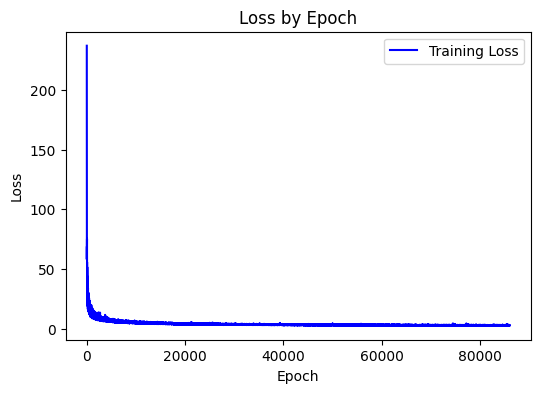

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_losses(losses):
    epochs = np.arange(1, len(losses) + 1)
    plt.figure(figsize=(6, 4))  # Set the figure size (width, height)
    plt.plot(epochs, losses, 'b', label='Training Loss')
    plt.title('Loss by Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
plot_losses(losses)

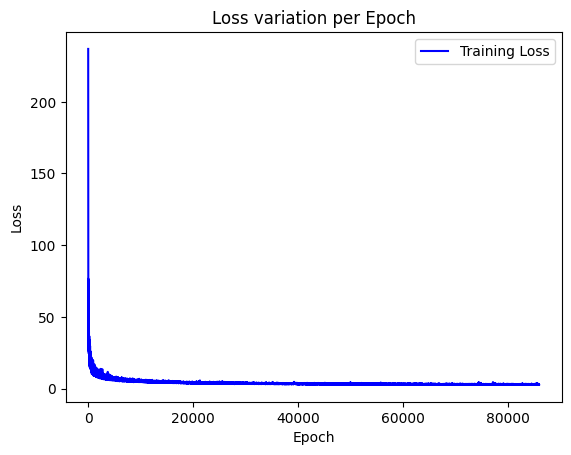

In [ ]:
import matplotlib.pyplot as plt

def plot_loss_per_epoch(losses):
    epochs = range(1, len(losses) + 1)

    plt.plot(epochs, losses, 'b', label='Training Loss')
    plt.title('Loss variation per Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
plot_loss_per_epoch(losses)


 > Enregistrement de modele AE



In [ ]:
save_path = '/content/drive/MyDrive/dental_ae_model_.tar'

torch.save(ae_model.state_dict(), save_path)

In [ ]:
loaded_model = torch.load('/content/drive/MyDrive/dental_ae_model_.tar', map_location=device)
loaded_model.keys()



> Fonction de perte Chamfer distance



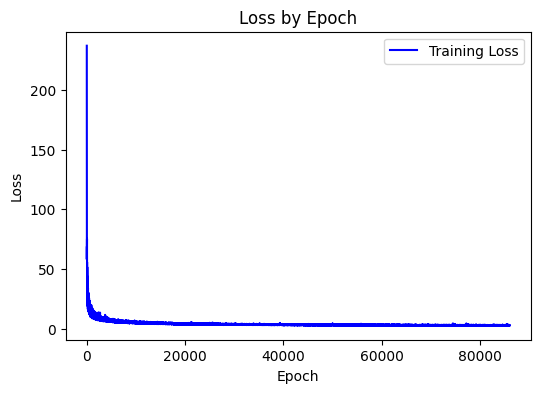

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_losses(losses):
    epochs = np.arange(1, len(losses) + 1)
    plt.figure(figsize=(6, 4))  # Set the figure size (width, height)
    plt.plot(epochs, losses, 'b', label='Training Loss')
    plt.title('Loss by Epoch')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
plot_losses(losses)

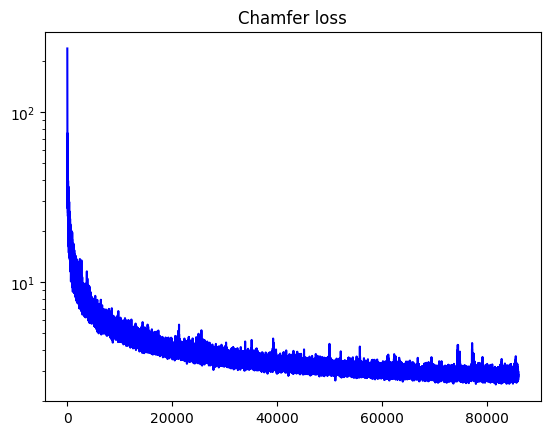

In [ ]:
def plot_loss(losses):
    epochs = len(losses)  # Calculate the number of epochs
    plt.plot(range(1, epochs + 1), losses, 'b-')
    plt.gca().patch.set_alpha(0)
    plt.title('Chamfer loss')
    plt.yscale('log')
    plt.show()
plot_loss(losses)



> visualisation de données initiales avec les données reconstruites


(32, 3, 3000)
(32, 3, 3000)


<ipython-input-17-a15ef9f25d02>:16: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



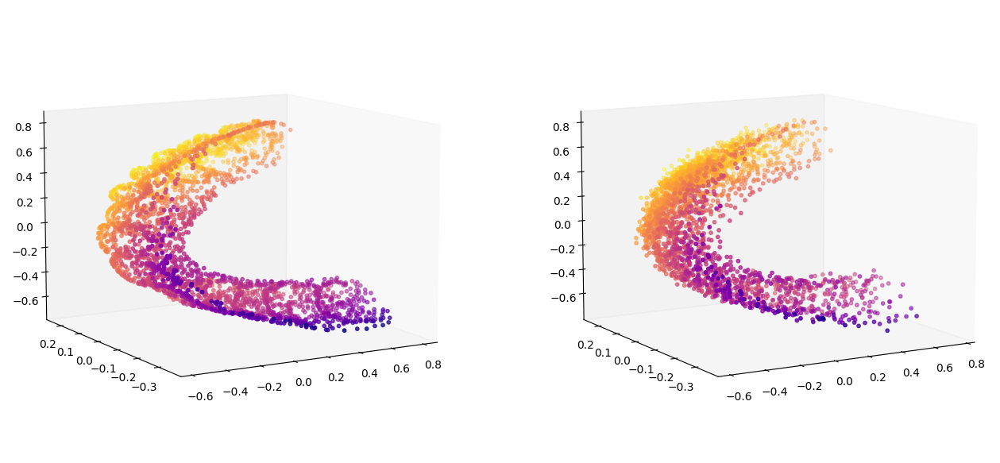

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

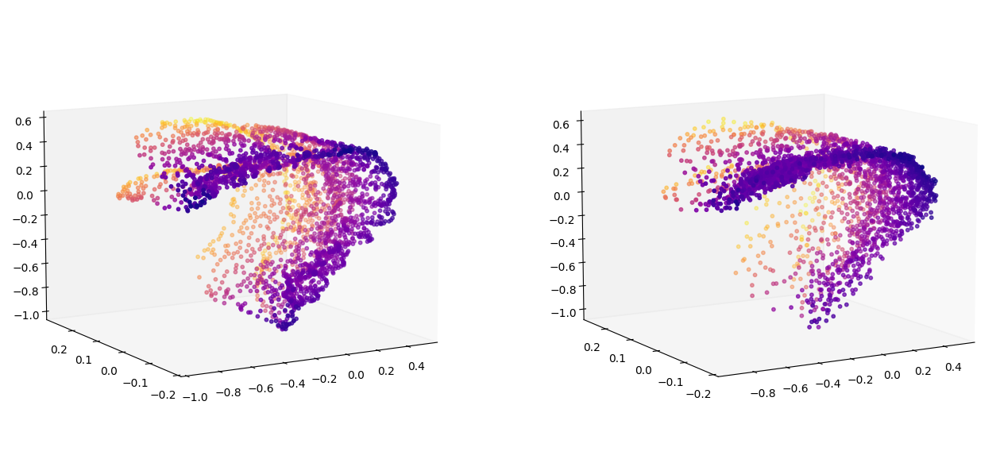

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

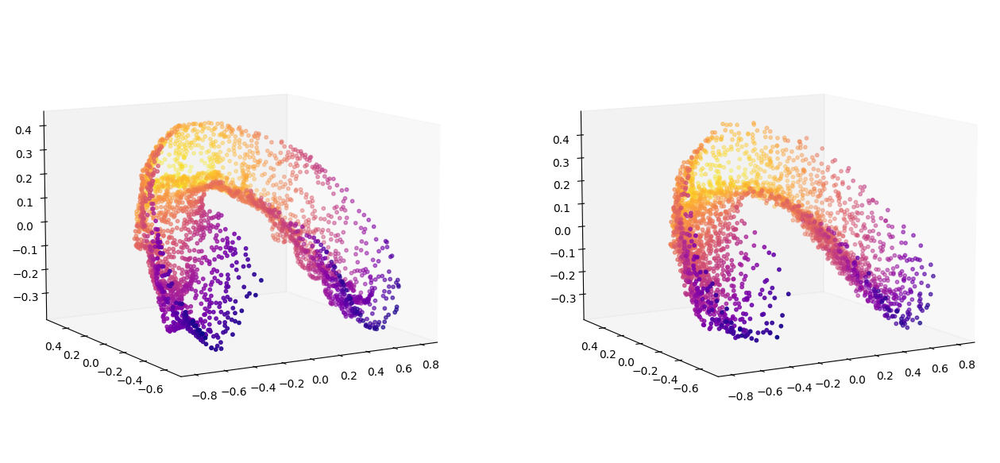

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

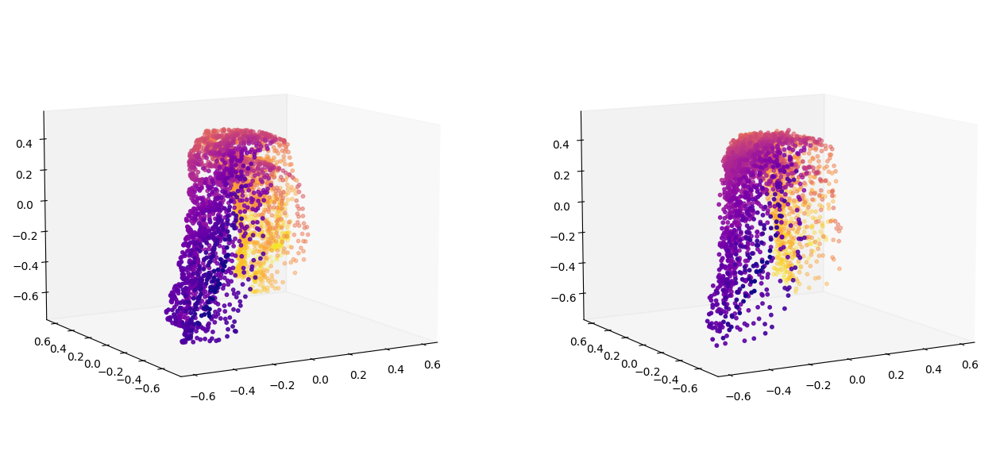

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

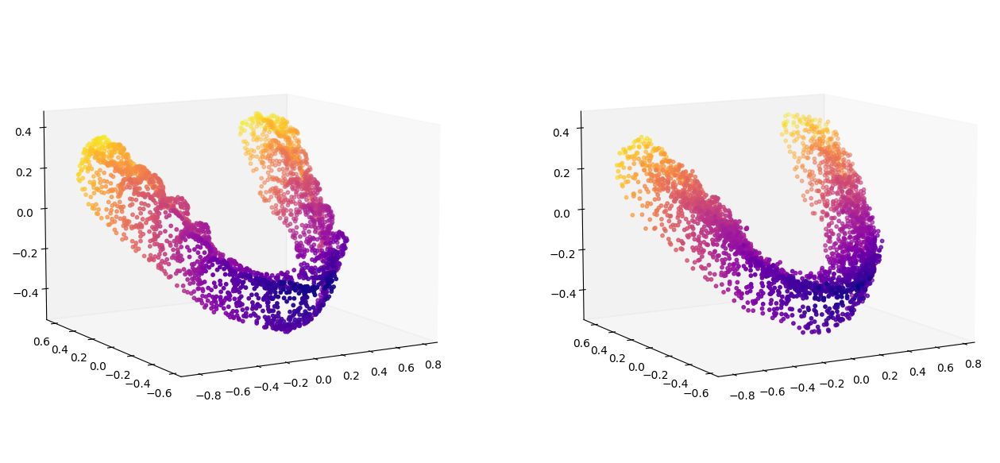

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

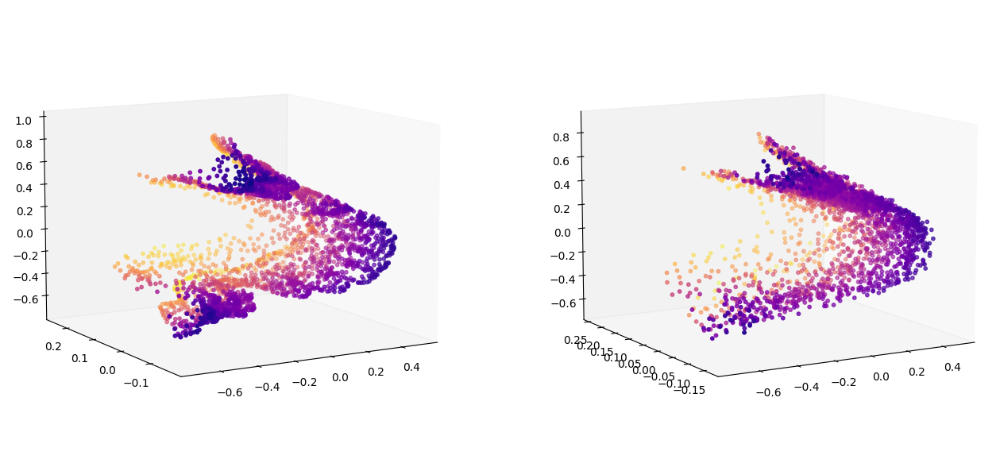

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

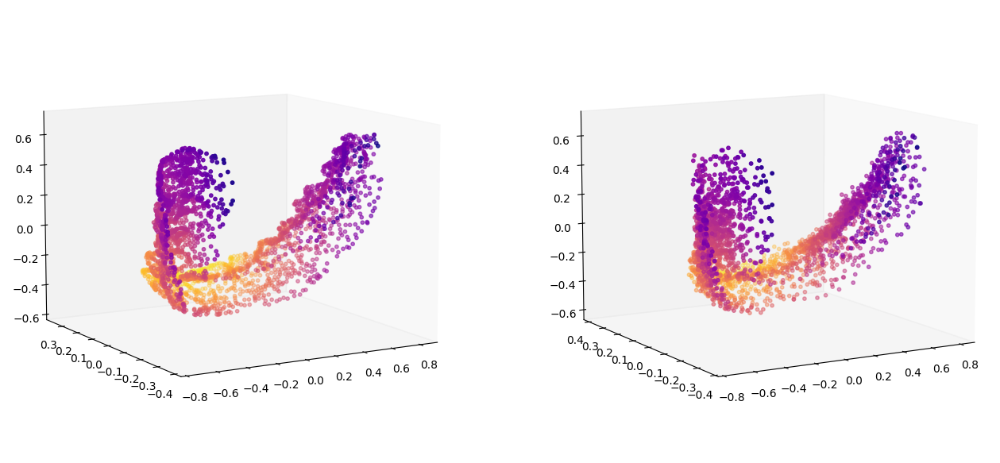

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

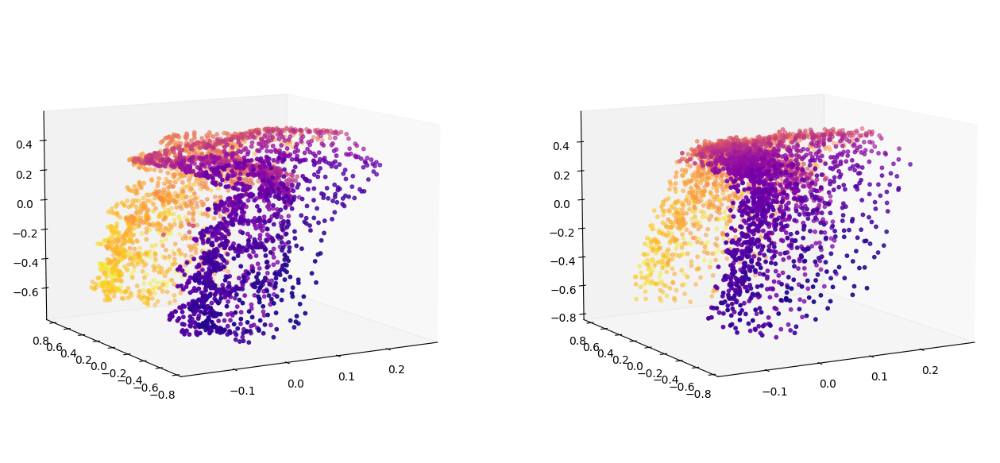

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

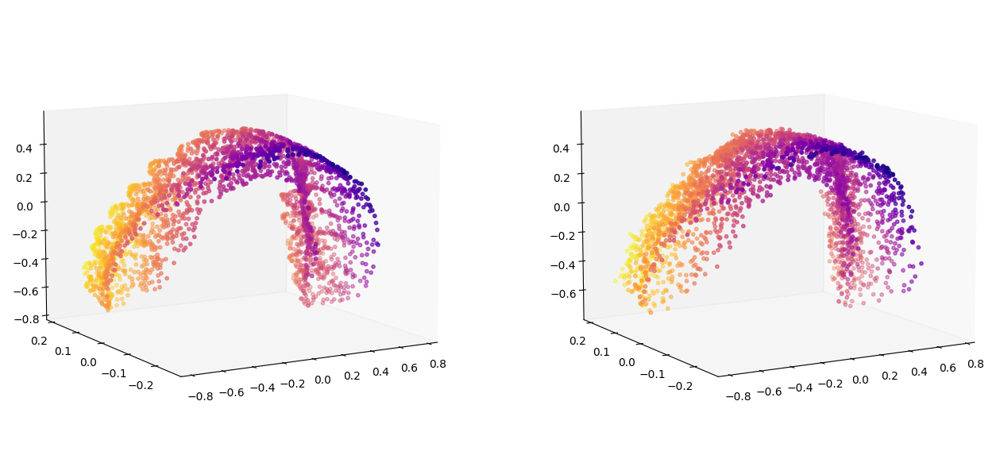

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

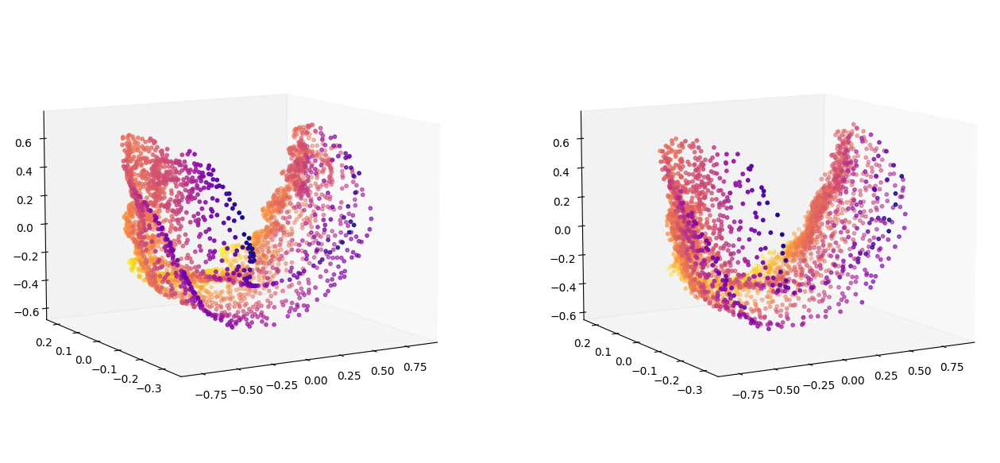

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

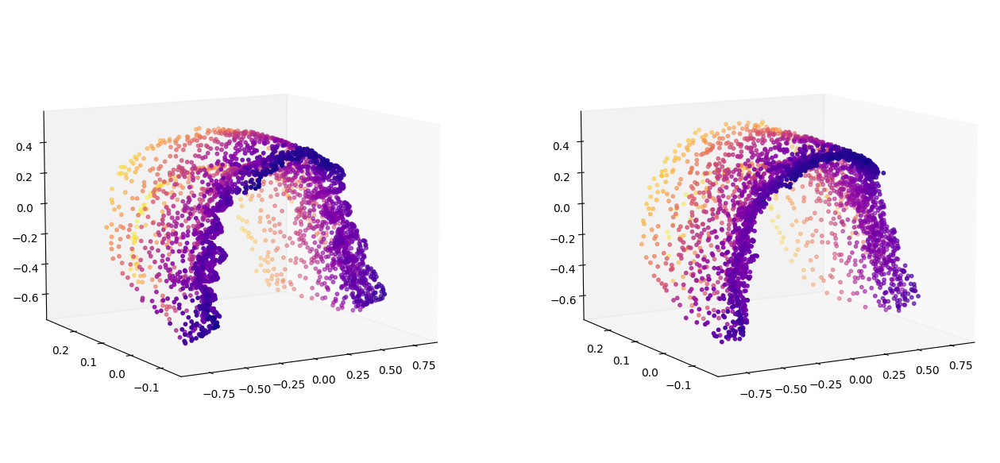

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

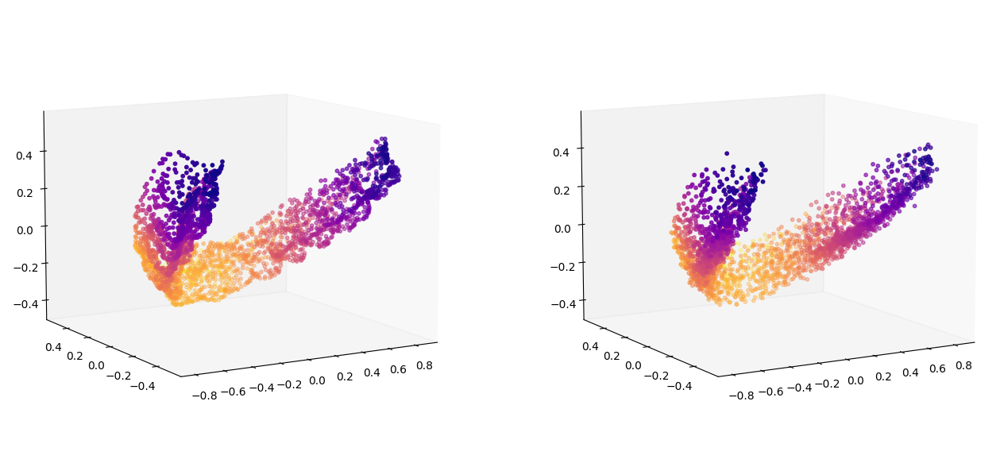

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

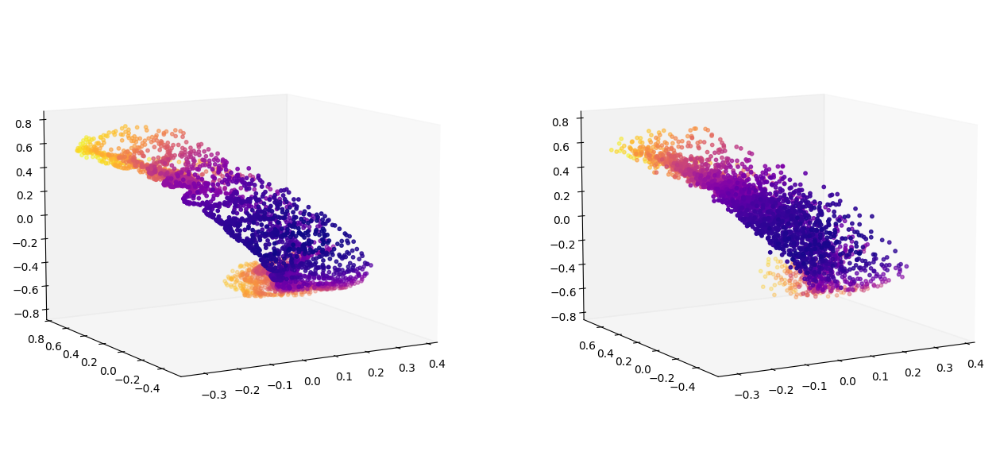

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

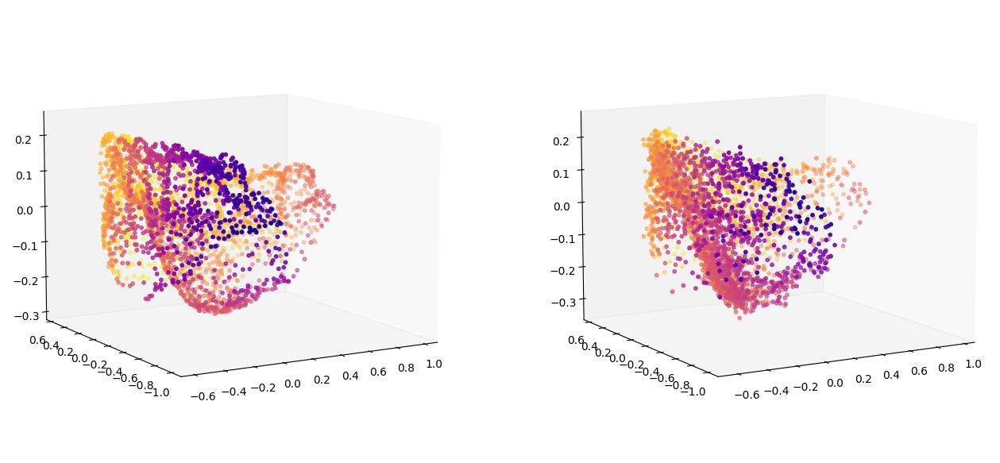

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

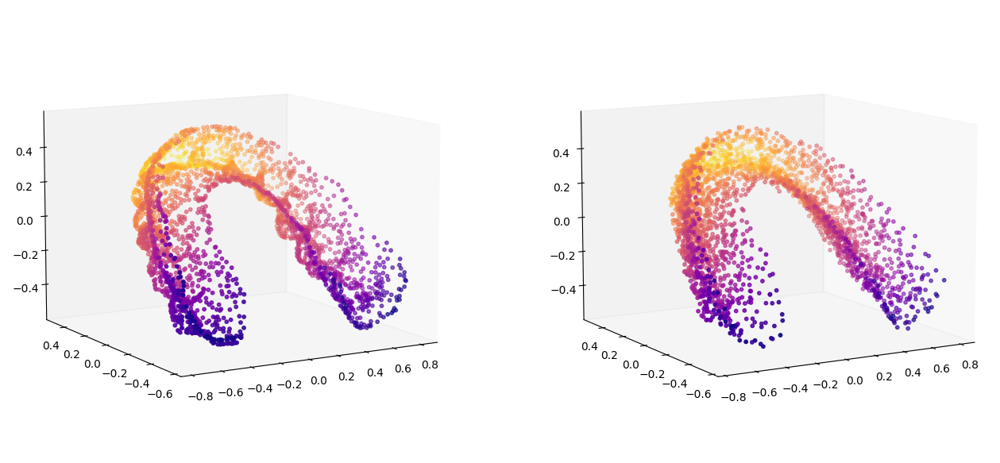

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

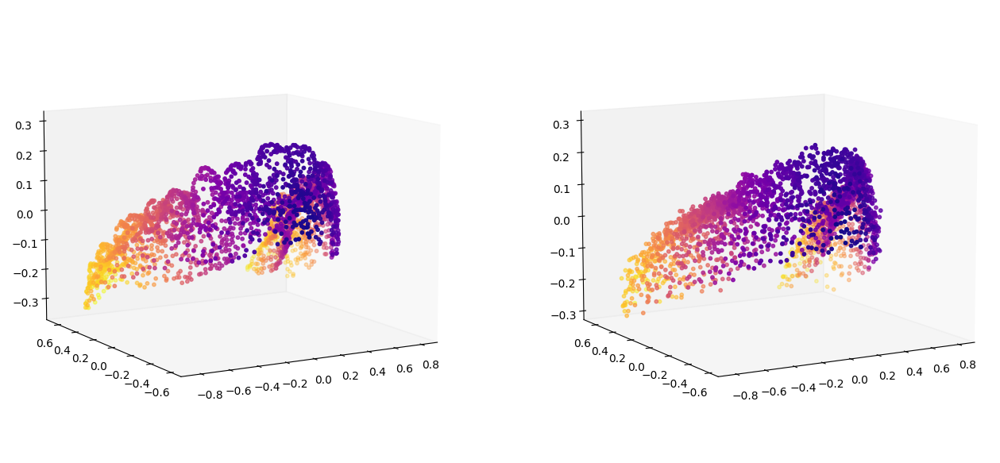

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

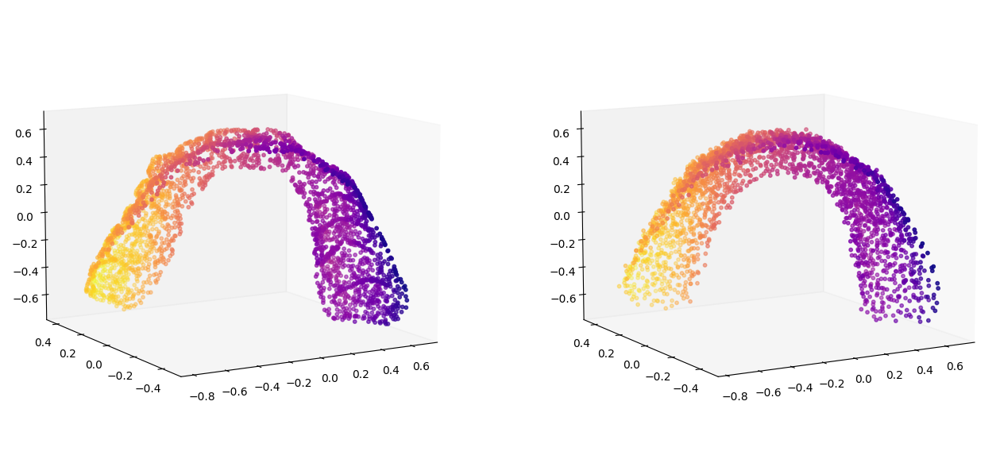

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

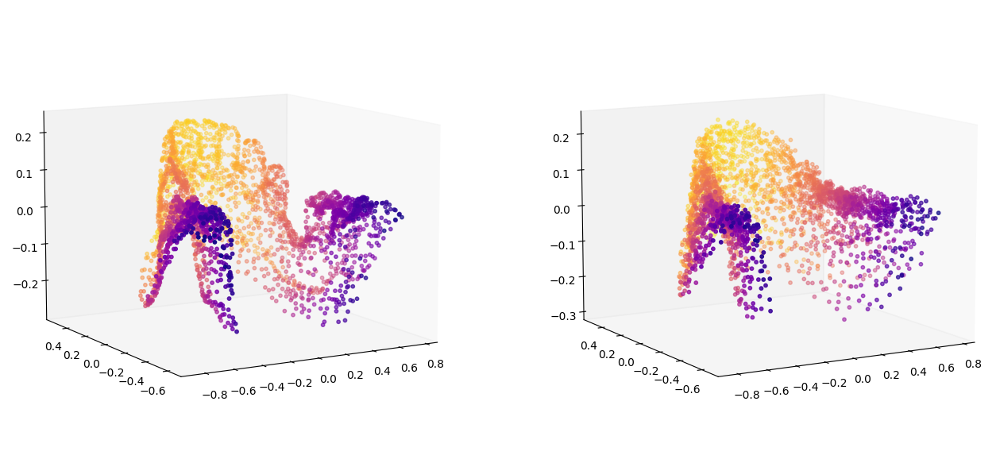

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

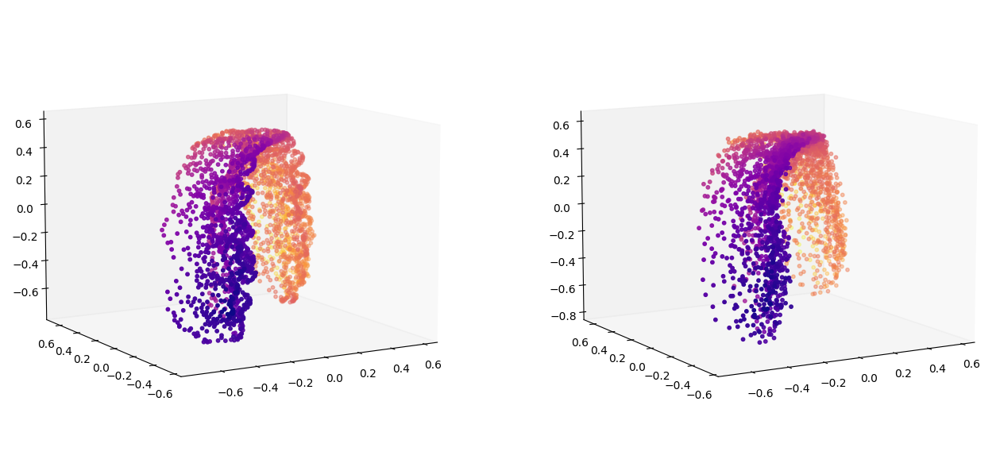

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

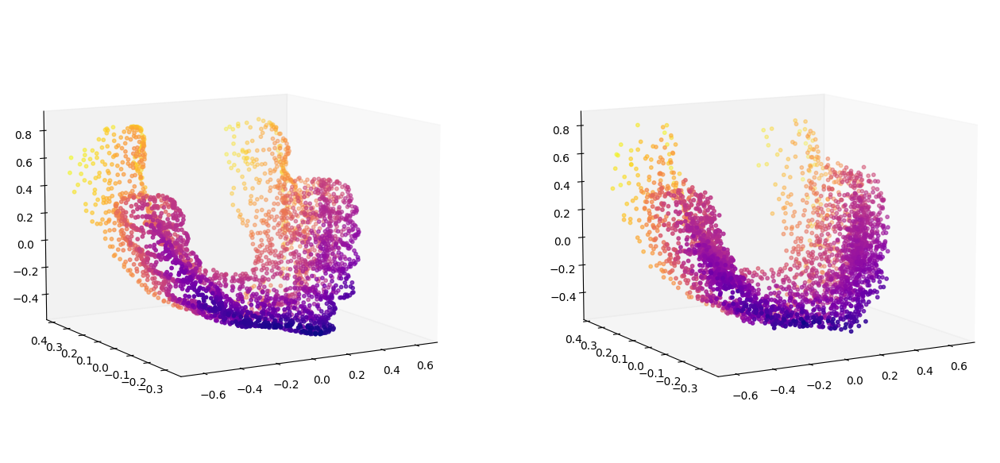

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [ ]:
batch_idx, batch_data = next(enumerate(dataloader))
x = batch_data.transpose(2, 1).to(device)

# reconstruct the samples:
x_hat = ae_model(x).cpu().detach().numpy()

x = x.cpu().detach().numpy()

print(x.shape)
print(x_hat.shape)


for i in range(20):
  # visualize_points(gen_samples[i].transpose(1,0), is_shapenet=True)
  visualize_real_and_generated_samples([x[i].transpose(1,0), x_hat[i].transpose(1,0)], is_shapenet=True)

In [ ]:
visualize_points_3d(x[1].transpose(1,0))



> Latent GAN implementation (dental dataset)



In [ ]:
class LatentGenerator(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LatentGenerator, self).__init__()

        self.model = nn.Sequential(
            nn.Linear(input_dim, 128), nn.ReLU(True),
            nn.Linear(128, output_dim), nn.ReLU(True)
        )

    def forward(self, x):
        return self.model(x)

    def init_params(self, layer):
        if type(layer) == nn.Linear:
            nn.init.xavier_uniform_(layer.weight.data)
            nn.init.zeros_(layer.bias.data)

In [ ]:
class LatentDiscriminator(nn.Module):
    def __init__(self, in_dim=128):
        super(LatentDiscriminator, self).__init__()

        self.decoder = nn.Sequential(
            nn.Linear(in_dim, 256), nn.ReLU(True),
            nn.Linear(256, 512), nn.ReLU(True),
            nn.Linear(512, 1), nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x

    def init_params(self, layer):
        if type(layer) == nn.Linear:
            nn.init.xavier_uniform_(layer.weight.data)
            nn.init.zeros_(layer.bias.data)

###  latent-GAN model

In [ ]:
# instantiate the l-GAN generator:
l_gan_gen_input_dim = 128
l_gan_gen_output_dim = 128 # equal to the output_dim of the encoder of the AE model

l_gan_gen = LatentGenerator(l_gan_gen_input_dim, l_gan_gen_output_dim).to(device)

# initialize the parameters:
l_gan_gen.apply(l_gan_gen.init_params)

mu = 0.
sigma = 0.2

z = torch.FloatTensor(1, l_gan_gen_input_dim).normal_(mu, sigma).to(device)

print(z.shape)
print(l_gan_gen(z).shape)

summary(l_gan_gen, (l_gan_gen_input_dim,))

# instantiate the l-GAN discriminator:
l_gan_dis_input_dim = 128
l_gan_dis = LatentDiscriminator(l_gan_dis_input_dim).to(device)

# initialize the parameters:
l_gan_dis.apply(l_gan_dis.init_params)

# print the summary:
y = torch.ones((1, l_gan_dis_input_dim)).to(device)
print(y.shape)

pred = l_gan_dis(y)
print(pred.shape)

summary(l_gan_dis, (l_gan_dis_input_dim,))

torch.Size([1, 128])
torch.Size([1, 128])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 128]          16,512
              ReLU-2                  [-1, 128]               0
            Linear-3                  [-1, 128]          16,512
              ReLU-4                  [-1, 128]               0
Total params: 33,024
Trainable params: 33,024
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.13
Estimated Total Size (MB): 0.13
----------------------------------------------------------------
torch.Size([1, 128])
torch.Size([1, 1])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                  [-1, 256]          33,024
              ReLU-2     

## Optimisation de latent-GAN

### Optimization setup

In [ ]:
# hyperparameters:
lr_gen = 1e-4
lr_dis = 1e-4
beta1 = 0.5
beta2 = 0.999

# two separate optimizers for the generator and discriminator:
optimizer_gen = optim.Adam(params=l_gan_gen.parameters(),
                           lr=lr_gen,
                           betas=(beta1, beta2))

optimizer_dis = optim.Adam(params=l_gan_dis.parameters(),
                           lr=lr_dis,
                           betas=(beta1, beta2))

# by supplying with the correct labels, we will make it
# equivalent to using non-saturating heuristic for the generator
# and the standard binary cross-entropy for the discriminator
criterion = nn.BCELoss().to(device)

### Creation d'un dataloader pour une classe

(we will produce the encodings with the AE model inside the training loop)

In [ ]:
batch_size = 32
dataloader_2 = DataLoader(dataset=new_data,
                        batch_size=batch_size,
                        shuffle=True,
                        drop_last=True)

print('Batch size: ', batch_size)
print('Number of batches:', len(dataloader_2))

Batch size:  32
Number of batches: 172


###  loop d'entrainement

In [ ]:
epochs = 250
print_period = 10

losses_gen = []
losses_dis = []

for i in range(epochs):
    t0 = time.time()

    for batch_idx, batch_data in enumerate(dataloader):
        print(batch_idx, end='\r')
        batch_t0 = time.time()
        batch_size = 32

        point_clouds = batch_data.transpose(2, 1).float().to(device)

        # compute the encodings with the AE model:
        x = ae_model.encoder(point_clouds)
        # compute the max here (due to the specifics of our implementation):
        x = torch.max(x, dim=-1)[0].detach() # (batch_size x l_gan_gen_input_dim)

        # sample random vectors and generate samples from them:
        z = torch.FloatTensor(batch_size, l_gan_gen_input_dim).normal_(mu, sigma).to(device)
        gen_samples = l_gan_gen(z)

        # get the discriminator output for the two types of input:
        prob_x = l_gan_dis(x)
        prob_gen_samples = l_gan_dis(gen_samples)
        ## the target probabilities:
        # the target probabilities:
        #prob_real = torch.ones((batch_size, 1)).to(device)
        #prob_fake = torch.zeros((batch_size, 1)).to(device)
        prob_real = torch.ones((batch_size, 1)).to(device)
        prob_fake = torch.zeros((batch_size, 1)).to(device)

        # the non-saturating heuristic loss for the generator:
        loss_gen = criterion(prob_gen_samples, prob_real)

        # compute the gradient of the loss_gen wrt the generator parameters:
        optimizer_gen.zero_grad()
        loss_gen.backward(retain_graph=True)

        # update the generator parameters:
        optimizer_gen.step()
        losses_gen.append(loss_gen.item())

        # the usual (binary cross-entropy) loss for the discriminator:
        loss_dis_real_term = criterion(prob_x, prob_real)
        loss_dis_fake_term = criterion(l_gan_dis(gen_samples.detach()), prob_fake)
        loss_dis = loss_dis_real_term + loss_dis_fake_term

        # compute the gradient and update the discriminator parameters:
        optimizer_dis.zero_grad()
        loss_dis.backward()
        optimizer_dis.step()
        losses_dis.append(loss_dis.item())

        if batch_idx % print_period == 0:
            print('ETA: %.5f, epoch: %d/%d, batch: %d/%d, loss_gen: %.3f, loss_dis: %.3f'
              % (time.time() - batch_t0, i+1, epochs, batch_idx, len(dataloader_2), torch.mean(torch.FloatTensor(losses_gen)), torch.mean(torch.FloatTensor(losses_dis)))
            )

    print('ETA: %.5f' % (time.time() - t0), end='\n\n')

ETA: 0.03142, epoch: 1/250, batch: 0/172, loss_gen: 0.696, loss_dis: 1.388
ETA: 0.01910, epoch: 1/250, batch: 10/172, loss_gen: 0.682, loss_dis: 1.331
ETA: 0.01811, epoch: 1/250, batch: 20/172, loss_gen: 0.671, loss_dis: 1.284
ETA: 0.02017, epoch: 1/250, batch: 30/172, loss_gen: 0.665, loss_dis: 1.240
ETA: 0.01762, epoch: 1/250, batch: 40/172, loss_gen: 0.659, loss_dis: 1.203
ETA: 0.01744, epoch: 1/250, batch: 50/172, loss_gen: 0.656, loss_dis: 1.172
ETA: 0.01753, epoch: 1/250, batch: 60/172, loss_gen: 0.656, loss_dis: 1.143
ETA: 0.01812, epoch: 1/250, batch: 70/172, loss_gen: 0.656, loss_dis: 1.124
ETA: 0.01793, epoch: 1/250, batch: 80/172, loss_gen: 0.658, loss_dis: 1.108
ETA: 0.01803, epoch: 1/250, batch: 90/172, loss_gen: 0.662, loss_dis: 1.094
ETA: 0.01791, epoch: 1/250, batch: 100/172, loss_gen: 0.665, loss_dis: 1.085
ETA: 0.01816, epoch: 1/250, batch: 110/172, loss_gen: 0.668, loss_dis: 1.078
ETA: 0.01775, epoch: 1/250, batch: 120/172, loss_gen: 0.671, loss_dis: 1.076
ETA: 0.018


## Enregistrement de modele

In [ ]:
save_path = '/content/drive/MyDrive/_l_gan_dental_3000_vertix.tar'
torch.save(
    {
      'l_gan_generator': l_gan_gen.state_dict(),
      'l_gan_discriminator': l_gan_dis.state_dict()
    },
    save_path
)

In [ ]:
loaded_model = torch.load( '/content/drive/MyDrive/_l_gan_dental_3000_vertix.tar', map_location=device)
loaded_model.keys()

dict_keys(['l_gan_generator', 'l_gan_discriminator'])

### Generation des objets synthétiques

(32, 3, 3000)
(32, 3, 3000)


<ipython-input-17-a15ef9f25d02>:16: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



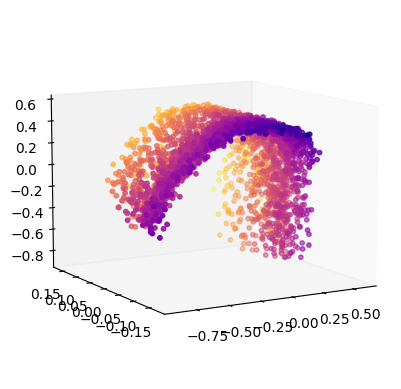

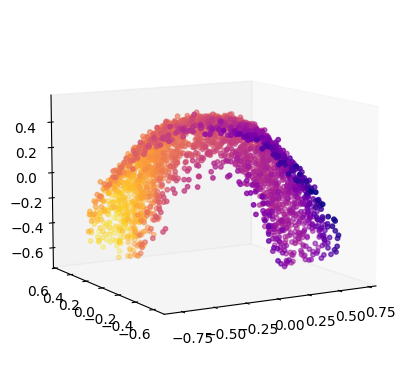

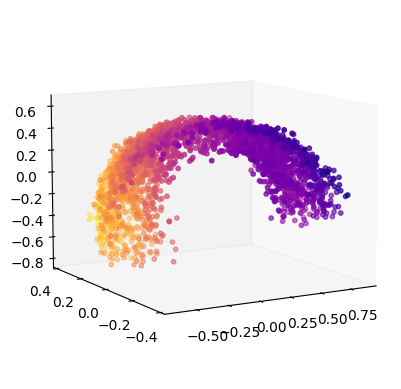

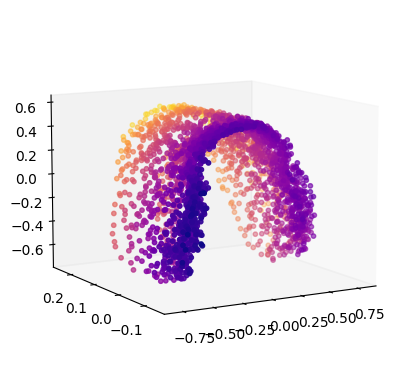

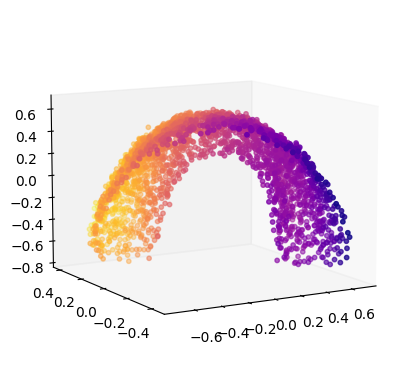

...

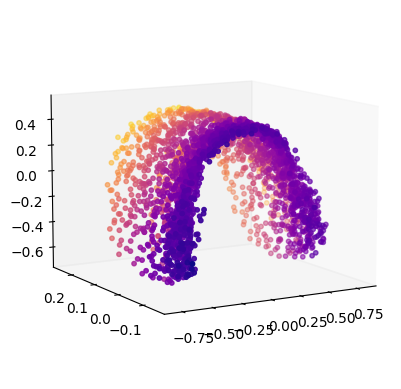

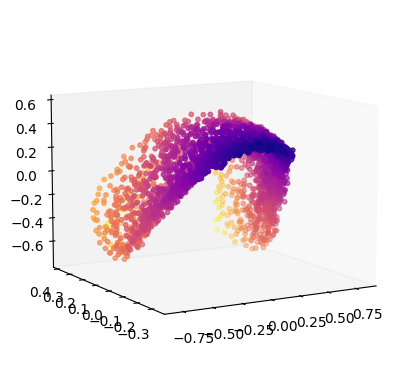

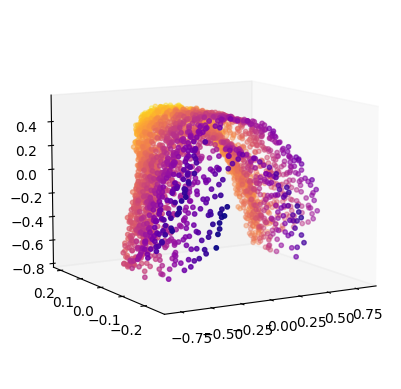

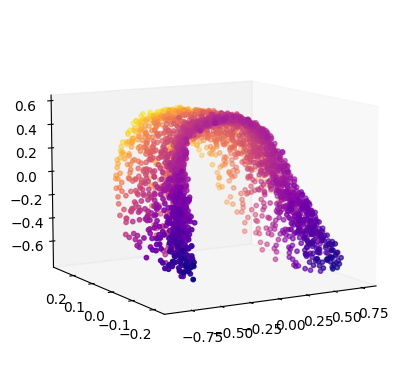

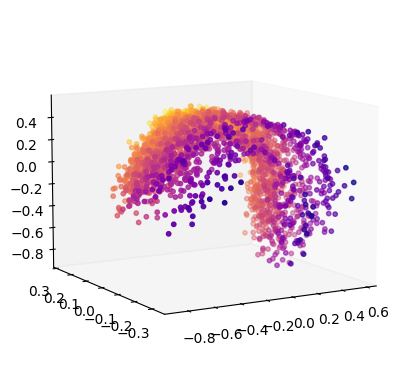

In [ ]:
batch_idx, batch_data = next(enumerate(dataloader_2))
x = batch_data.transpose(2, 1).cpu().detach().numpy()

# sample the noise vector:
z = torch.Tensor(batch_size, l_gan_gen_input_dim).normal_(mu, sigma).to(device)

latent_samples = l_gan_gen(z)
gen_samples = ae_model.decoder(latent_samples).view(batch_size, 3, -1).cpu().detach().numpy()

print(x.shape)
print(gen_samples.shape)

for i in range(batch_size):
  visualize_points(gen_samples[i].transpose(1,0), is_shapenet=True)
  # visualize_real_and_generated_samples([x[i].transpose(1,0), gen_samples[i].transpose(1,0)], is_shapenet=True)



> save them


In [ ]:
!pip install trimesh

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 681.6/681.6 kB 13.4 MB/s eta 0:00:00


In [ ]:
import os
import numpy as np
import trimesh

save_path = '/content/drive/MyDrive/synthetique'

# Assuming you have the necessary variables defined:
batch_idx, batch_data = next(enumerate(dataloader_2))
x = batch_data.transpose(2, 1).cpu().detach().numpy()

# sample the noise vector:
z = torch.Tensor(batch_size, l_gan_gen_input_dim).normal_(mu, sigma).to(device)

latent_samples = l_gan_gen(z)
gen_samples = ae_model.decoder(latent_samples).view(batch_size, 3, -1).cpu().detach().numpy()

print(x.shape)
print(gen_samples.shape)

# Create the 'synthetique' directory if it doesn't exist
if not os.path.exists(save_path):
    os.makedirs(save_path)

for i in range(batch_size):
    # Format the file name
    file_name = os.path.join(save_path, f"object_{i}.ply")

    # Transpose the object vertices to the required format
    vertices = gen_samples[i].transpose(1, 0)

    # Create a trimesh object from the vertices
    mesh = trimesh.Trimesh(vertices=vertices)

    # Save the mesh as .ply file
    mesh.export(file_name, file_type='ply')

    # Print the file name for confirmation
    print(f"Object {i} saved as {file_name}")


(32, 3, 3000)
(32, 3, 3000)
Object 0 saved as /content/drive/MyDrive/synthetique/object_0.ply
Object 1 saved as /content/drive/MyDrive/synthetique/object_1.ply
Object 2 saved as /content/drive/MyDrive/synthetique/object_2.ply
Object 3 saved as /content/drive/MyDrive/synthetique/object_3.ply
Object 4 saved as /content/drive/MyDrive/synthetique/object_4.ply
Object 5 saved as /content/drive/MyDrive/synthetique/object_5.ply
Object 6 saved as /content/drive/MyDrive/synthetique/object_6.ply
Object 7 saved as /content/drive/MyDrive/synthetique/object_7.ply
Object 8 saved as /content/drive/MyDrive/synthetique/object_8.ply
Object 9 saved as /content/drive/MyDrive/synthetique/object_9.ply
Object 10 saved as /content/drive/MyDrive/synthetique/object_10.ply
Object 11 saved as /content/drive/MyDrive/synthetique/object_11.ply
Object 12 saved as /content/drive/MyDrive/synthetique/object_12.ply
Object 13 saved as /content/drive/MyDrive/synthetique/object_13.ply
Object 14 saved as /content/drive/MyDriv



> Latent Gan evaluation



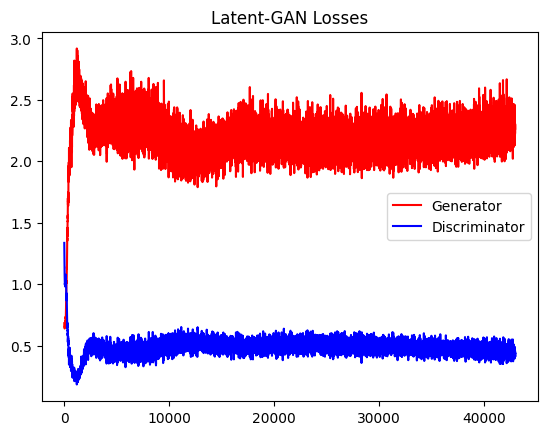

In [ ]:
def running_mean(data, periods=10):
    # from https://github.com/artemsavkin/latent3d/blob/master/pcl_latent3d_shapenet.ipynb
    weights = np.ones(periods) / periods
    return np.convolve(data, weights, mode='valid')

rm_losses_gen = running_mean(np.asarray(losses_gen))
rm_losses_dis = running_mean(np.asarray(losses_dis))


plt.plot(range(0, len(rm_losses_gen)), rm_losses_gen, 'r-', label='Generator')
plt.plot(range(0, len(rm_losses_dis)), rm_losses_dis, 'b-', label='Discriminator')
plt.gca().patch.set_alpha(0)
plt.title('Latent-GAN Losses')
plt.legend()
plt.show()

In [ ]:
visualize_points_3d(gen_samples[2].transpose(1,0))